In [1]:
!pip install adversarial-robustness-toolbox
!pip install ml_collections

     |████████████████████████████████| 972kB 6.5MB/s 
     |████████████████████████████████| 21.6MB 1.5MB/s 
     |████████████████████████████████| 235kB 48.6MB/s 
     |████████████████████████████████| 3.4MB 45.2MB/s 
     |████████████████████████████████| 747kB 44.4MB/s 
     |████████████████████████████████| 25.3MB 41.3MB/s 
  Found existing installation: llvmlite 0.34.0
    Uninstalling llvmlite-0.34.0:
      Successfully uninstalled llvmlite-0.34.0
  Found existing installation: numba 0.51.2
    Uninstalling numba-0.51.2:
      Successfully uninstalled numba-0.51.2
     |████████████████████████████████| 92kB 4.1MB/s 


In [2]:
!git clone https://github.com/jeonsworld/ViT-pytorch.git

Cloning into 'ViT-pytorch'...
remote: Enumerating objects: 170, done.
remote: Counting objects: 100% (170/170), done.
remote: Compressing objects: 100% (123/123), done.
remote: Total 170 (delta 86), reused 121 (delta 43), pack-reused 0
Receiving objects: 100% (170/170), 21.21 MiB | 32.60 MiB/s, done.
Resolving deltas: 100% (86/86), done.


In [3]:
%cd ViT-pytorch

/content/ViT-pytorch


In [4]:
!ls

img	 models     requirements.txt  utils
LICENSE  README.md  train.py	      visualize_attention_map.ipynb


In [5]:
import typing
import io
import os

import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt

from urllib.request import urlretrieve

from PIL import Image
from torchvision import transforms

from models.modeling import VisionTransformer, CONFIGS

In [6]:
# import timm
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import matplotlib
import matplotlib.pyplot as plt
import numpy as np

from art.attacks.evasion import FastGradientMethod, ProjectedGradientDescentPyTorch
from art.estimators.classification import PyTorchClassifier
from art.utils import load_mnist

import urllib
from PIL import Image
# from timm.data import resolve_data_config
# from timm.data.transforms_factory import create_transform

In [7]:
!mkdir attention_data

In [8]:

os.makedirs("attention_data", exist_ok=True)
if not os.path.isfile("attention_data/ilsvrc2012_wordnet_lemmas.txt"):
    urlretrieve("https://storage.googleapis.com/bit_models/ilsvrc2012_wordnet_lemmas.txt", "attention_data/ilsvrc2012_wordnet_lemmas.txt")
    
if not os.path.isfile("attention_data/ViT-B_16-224.npz"):
    urlretrieve("https://storage.googleapis.com/vit_models/imagenet21k+imagenet2012/ViT-B_16-224.npz", "attention_data/ViT-B_16-224.npz")

imagenet_labels = dict(enumerate(open('attention_data/ilsvrc2012_wordnet_lemmas.txt')))

In [9]:
mean=[0.5, 0.5, 0.5]
std=[0.5, 0.5, 0.5]

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

invert_normalize = transforms.Normalize(
   mean= [-m/s for m, s in zip(mean, std)],
   std= [1/s for s in std]
)

In [10]:
# Test Image

img_url, filename = ("https://c.files.bbci.co.uk/12A9B/production/_111434467_gettyimages-1143489763.jpg", "cat.jpg")
urlretrieve(img_url, "attention_data/img.jpg")

# Prepare Model
config = CONFIGS["ViT-B_16"]
model = VisionTransformer(config, num_classes=1000, zero_head=False, img_size=224, vis=True)
model.load_from(np.load("attention_data/ViT-B_16-224.npz"))
model.eval()

im = Image.open("attention_data/img.jpg")
x = transform(im)
x.size()

torch.Size([3, 224, 224])

In [11]:
model

VisionTransformer(
  (transformer): Transformer(
    (embeddings): Embeddings(
      (patch_embeddings): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): Encoder(
      (layer): ModuleList(
        (0): Block(
          (attention_norm): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (ffn_norm): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (ffn): Mlp(
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (attn): Attention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (out): Linear(in_features=768, out_features=768, bias=True)
     

## Function Definitions

In [ ]:
def construct_attention_maps(x, model, print_individual_layers=False):
    # Insert Batch Dimension
    if (len(x.shape) == 3):
        x = x.unsqueeze(0)

    logits, att_mat = model(x)

    att_mat = torch.stack(att_mat).squeeze(1)

    # Average the attention weights across all heads.
    att_mat = torch.mean(att_mat, dim=1)

    # To account for residual connections, we add an identity matrix to the
    # attention matrix and re-normalize the weights.
    residual_att = torch.eye(att_mat.size(1))
    aug_att_mat = att_mat + residual_att
    aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)

    # Recursively multiply the weight matrices
    joint_attentions = torch.zeros(aug_att_mat.size())
    joint_attentions[0] = aug_att_mat[0]

    for n in range(1, aug_att_mat.size(0)):
        joint_attentions[n] = torch.matmul(aug_att_mat[n], joint_attentions[n-1])
        
    # Attention from the output token to the input space.
    v = joint_attentions[-1]
    grid_size = int(np.sqrt(aug_att_mat.size(-1)))
    mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
    mask = cv2.resize(mask / mask.max(), im.size)[..., np.newaxis]
    result = (mask * im).astype("uint8")

    # Resize to Model input size
    orig_img = im.resize((224, 224))
    result = cv2.resize(result, (224, 224))

    probs = torch.nn.Softmax(dim=-1)(logits)
    top5 = torch.argsort(probs, dim=-1, descending=True)
    print("Prediction Label and Attention Map!\n")
    for idx in top5[0, :5]:
        print(f'{probs[0, idx.item()]:.5f} : {imagenet_labels[idx.item()]}', end='')

    averaged_result = result
    if not print_individual_layers:
        return averaged_result

    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))
    ax1.set_title('Original')
    ax2.set_title('Averaged Attention Map')
    _ = ax1.imshow(orig_img)
    _ = ax2.imshow(result)

    for i, v in enumerate(joint_attentions):
        # Attention from the output token to the input space.
        mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
        mask = cv2.resize(mask / mask.max(), im.size)[..., np.newaxis]
        result = (mask * im).astype("uint8")

        # Resize to Model input size
        orig_img = im.resize((224, 224))
        result = cv2.resize(result, (224, 224))

        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))
        ax1.set_title('Original')
        ax2.set_title('Attention Map_%d Layer' % (i+1))
        _ = ax1.imshow(orig_img)
        _ = ax2.imshow(result)

    return averaged_result

def plot_orig_saliency_perturbed_attnmap(x, model, attn_map):
    # Insert Batch Dimension
    if (len(x.shape) == 3):
        x = x.unsqueeze(0)

    # Saliency
    x.requires_grad_(True)
    logits = wrapped_model(x)

    out_max_index = logits.argmax()
    out_max = logits[0, out_max_index]
    out_max.backward()

    saliency_adv, _ = torch.max(x.grad.data.abs(),dim=1)
    saliency_adv = saliency_adv.cpu()

    x.requires_grad_(False)

    # Original Image
    orig = im.resize((224, 224))

    # Perturbed Image
    img_tensor = np.swapaxes(invert_normalize(x)[0].T, 0, 1)

    # Plotting
    # fig, (ax1, ax2, ax3, 4) = plt.subplots(ncols=3, figsize=(16, 16))
    fig, axs = plt.subplots(ncols=2, nrows=2, figsize=(16, 16))

    axs[0, 0].set_title('Original')
    axs[0, 1].set_title('Perturbed Imagee')
    axs[1, 0].set_title('Averaged Attention Map')
    axs[1, 1].set_title('Saliency Map')

    _ = axs[0, 0].imshow(orig)
    _ = axs[0, 1].imshow(img_tensor)
    _ = axs[1, 0].imshow(attn_map)
    _ = axs[1, 1].imshow(saliency_adv[0], cmap=plt.cm.hot)

In [ ]:
class TransformerWrapper(nn.Module):
    def __init__(self, model):
        super(TransformerWrapper, self).__init__()
        self.model = model

    def forward(self, x):
        return model(x)[0]

    def attention_mats(self):
        return model(x)[1]

wrapped_model = TransformerWrapper(model)

In [ ]:
map = construct_attention_maps(x=x, model=model, print_individual_layers=True)

Output hidden; open in https://colab.research.google.com to view.

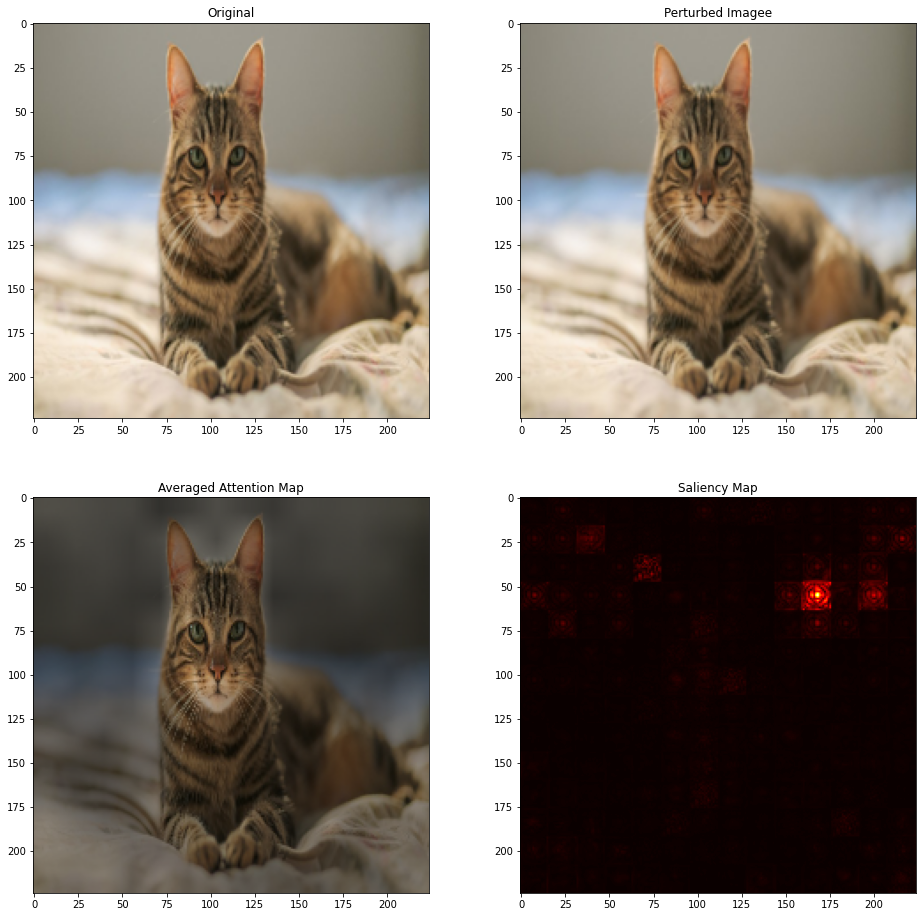

In [ ]:
# plot_orig_saliency_perturbed(x=x, model=model)
plot_orig_saliency_perturbed_attnmap(x=x, model=model, attn_map=map)

## Tabby Cat -> Egyptian_cat, Untargeted, L Infty

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.01)

classifier = PyTorchClassifier(
    model=wrapped_model, # Use wrapped model, only returns logits
    loss=criterion,
    optimizer=optimizer,
    input_shape=(3, 224, 224),
    nb_classes=1000,
)

# set up PGD-20 attack
eps = 8 / 255
attack = ProjectedGradientDescentPyTorch(
        estimator=classifier,
        norm="inf",
        eps=eps,
        targeted=False,
        eps_step=0.05,
        max_iter=20
)

x.requires_grad_(False)

adv_1 = attack.generate(x=x.unsqueeze(0))
adv_tensor = torch.from_numpy(adv_1).to('cpu')

adv_tensor.requires_grad_()

/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:694: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_grad = torch.tensor(x).to(self._device)
/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:695: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y_grad = torch.tensor(y).to(self._device)


tensor([[[[ 0.0480,  0.0431,  0.0431,  ..., -0.0951, -0.0951, -0.1029],
          [ 0.0559,  0.0431,  0.0431,  ..., -0.0824, -0.0902, -0.0902],
          [ 0.0480,  0.0431,  0.0431,  ..., -0.0824, -0.0902, -0.0902],
          ...,
          [ 0.5529,  0.6078,  0.5294,  ...,  0.5922,  0.5922,  0.5608],
          [ 0.5892,  0.5765,  0.6235,  ...,  0.5922,  0.5843,  0.5686],
          [ 0.5922,  0.6549,  0.5892,  ...,  0.6265,  0.6265,  0.5608]],

         [[ 0.0039,  0.0118,  0.0245,  ..., -0.1686, -0.1559, -0.1765],
          [ 0.0118,  0.0118,  0.0118,  ..., -0.1559, -0.1765, -0.1637],
          [ 0.0039,  0.0118,  0.0118,  ..., -0.1686, -0.1637, -0.1637],
          ...,
          [ 0.4902,  0.4824,  0.4667,  ...,  0.4873,  0.4794,  0.4480],
          [ 0.5216,  0.4588,  0.5059,  ...,  0.4794,  0.4637,  0.4402],
          [ 0.5373,  0.5373,  0.5216,  ...,  0.5137,  0.5059,  0.4696]],

         [[-0.0902, -0.0824, -0.0696,  ..., -0.2863, -0.2735, -0.2814],
          [-0.0824, -0.0196, -

In [ ]:
map = construct_attention_maps(x=adv_tensor, model=model)

Prediction Label and Attention Map!

0.99042 : Egyptian_cat
0.00688 : tabby, tabby_cat
0.00089 : tiger_cat
0.00031 : lynx, catamount
0.00008 : quilt, comforter, comfort, puff


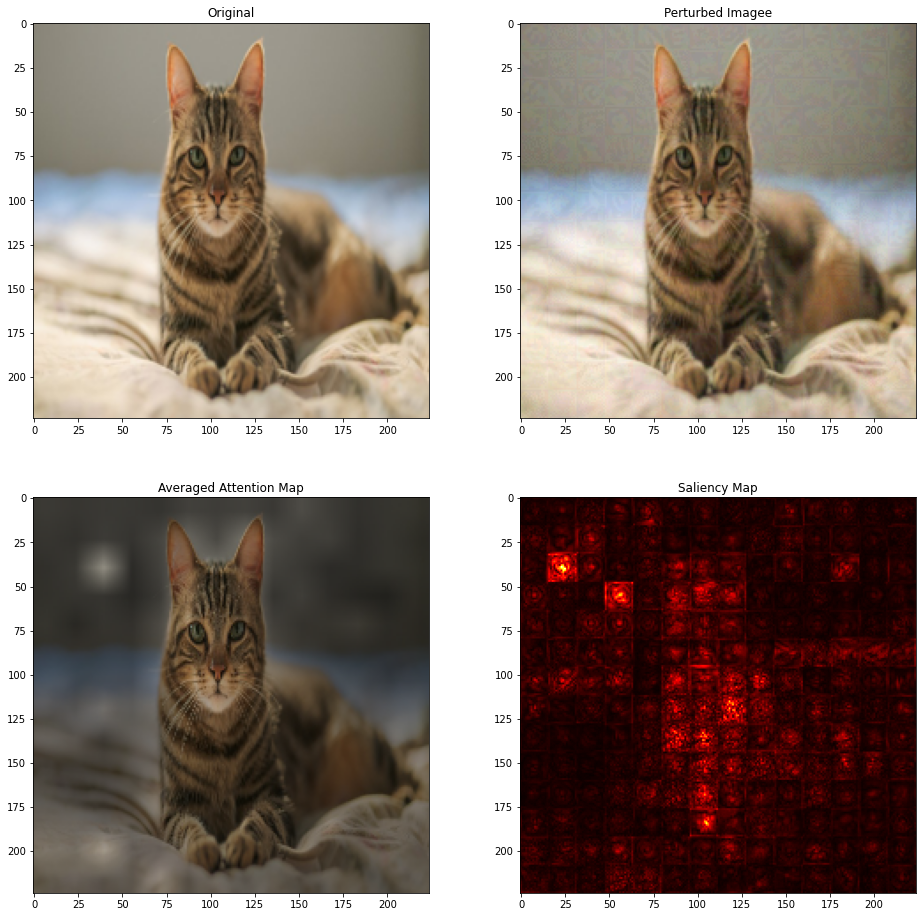

In [ ]:
plot_orig_saliency_perturbed_attnmap(x=adv_tensor, model=model, attn_map=map)

## Tabby -> coffee mug, Targeted, L Infty


In [ ]:
# set up PGD-20 attack
eps = 8 / 255
attack = ProjectedGradientDescentPyTorch(
        estimator=classifier,
        norm="inf",
        eps=eps,
        targeted=True,
        eps_step=0.05,
        max_iter=20
)

x.requires_grad_(False)

#  504: 'coffee mug',
target_label = torch.zeros((1, 1000))
target_label[0][504] = 1

adv_1 = attack.generate(x=x.unsqueeze(0), y=target_label)
adv_tensor = torch.from_numpy(adv_1).to('cpu')

adv_tensor.requires_grad_()

/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:694: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_grad = torch.tensor(x).to(self._device)
/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:695: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y_grad = torch.tensor(y).to(self._device)


tensor([[[[ 0.0853,  0.0431,  0.0431,  ..., -0.0824, -0.0951, -0.1029],
          [ 0.1059,  0.0431,  0.1059,  ..., -0.0951, -0.1029, -0.1529],
          [ 0.0980,  0.1059,  0.0431,  ..., -0.0951, -0.1029, -0.1529],
          ...,
          [ 0.6157,  0.6078,  0.5794,  ...,  0.6549,  0.6549,  0.5608],
          [ 0.6392,  0.5892,  0.6235,  ...,  0.6549,  0.6343,  0.5686],
          [ 0.6549,  0.6549,  0.6392,  ...,  0.6392,  0.6392,  0.5608]],

         [[ 0.0667,  0.0118,  0.0118,  ..., -0.1059, -0.1059, -0.1137],
          [ 0.0745,  0.0245,  0.0245,  ..., -0.1059, -0.1137, -0.1137],
          [ 0.0667,  0.0245,  0.0245,  ..., -0.1059, -0.1637, -0.1137],
          ...,
          [ 0.4902,  0.4824,  0.4167,  ...,  0.5373,  0.5294,  0.4353],
          [ 0.5216,  0.4716,  0.5059,  ...,  0.5294,  0.5137,  0.4275],
          [ 0.5373,  0.5373,  0.5216,  ...,  0.5010,  0.5059,  0.4196]],

         [[-0.0902, -0.0824, -0.0824,  ..., -0.2863, -0.2863, -0.2314],
          [-0.0824, -0.0696, -

In [ ]:
map = construct_attention_maps(x=adv_tensor, model=model)

Prediction Label and Attention Map!

0.61149 : coffee_mug
0.31981 : cup
0.02586 : tabby, tabby_cat
0.01256 : tiger_cat
0.00405 : Egyptian_cat


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


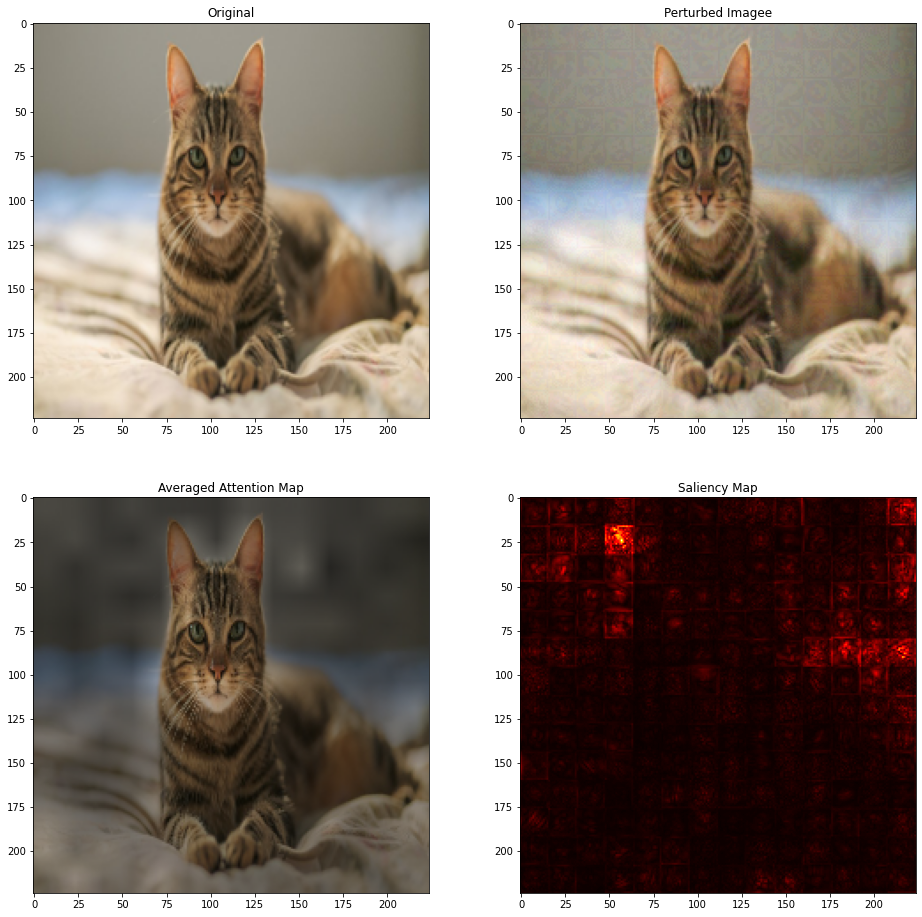

In [ ]:
plot_orig_saliency_perturbed_attnmap(x=adv_tensor, model=model, attn_map=map)

### The above attack passsed, unlike the dog. I guess a brorwn cat is more similar to a coffee mug than a white ddog, lets try a stronger attack anyway

In [ ]:
# set up PGD-20 attack
eps = 0.3
attack = ProjectedGradientDescentPyTorch(
        estimator=classifier,
        norm="inf",
        eps=eps,
        targeted=True,
        eps_step=0.05,
        max_iter=20 
)

x.requires_grad_(False)

#  504: 'coffee mug',
target_label = torch.zeros((1, 1000))
target_label[0][504] = 1

adv_1 = attack.generate(x=x.unsqueeze(0), y=target_label)
adv_tensor = torch.from_numpy(adv_1).to('cpu')

adv_tensor.requires_grad_()

/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:694: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_grad = torch.tensor(x).to(self._device)
/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:695: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y_grad = torch.tensor(y).to(self._device)


tensor([[[[-0.0333,  0.0245, -0.1255,  ..., -0.3637, -0.1137,  0.1284],
          [-0.0255, -0.2255, -0.1255,  ..., -0.1137, -0.1216, -0.2216],
          [-0.0833, -0.1255, -0.1755,  ..., -0.3137, -0.2216, -0.3216],
          ...,
          [ 0.6843,  0.4765,  0.3608,  ...,  0.5235,  0.4235,  0.3422],
          [ 0.4078,  0.4078,  0.5922,  ...,  0.5235,  0.7157,  0.4000],
          [ 0.4235,  0.3235,  0.3078,  ...,  0.5078,  0.3078,  0.2922]],

         [[-0.0647, -0.0569, -0.1069,  ..., -0.4373, -0.3373, -0.1451],
          [-0.0569, -0.0569,  0.1431,  ..., -0.3373, -0.0451, -0.0951],
          [-0.1647, -0.1569, -0.1069,  ..., -0.4373, -0.3451, -0.0951],
          ...,
          [ 0.5588,  0.6510,  0.4353,  ...,  0.8059,  0.7980,  0.6667],
          [ 0.7902,  0.2902,  0.2745,  ...,  0.7980,  0.7824,  0.6588],
          [ 0.7059,  0.4059,  0.4902,  ...,  0.7824,  0.7745,  0.6510]],

         [[-0.3088, -0.0510,  0.0490,  ..., -0.5049, -0.5549, -0.5127],
          [-0.1510, -0.0510, -

In [ ]:
map = construct_attention_maps(x=adv_tensor, model=model)

Prediction Label and Attention Map!

0.99779 : coffee_mug
0.00021 : neck_brace
0.00018 : whiskey_jug
0.00016 : stole
0.00007 : cup


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


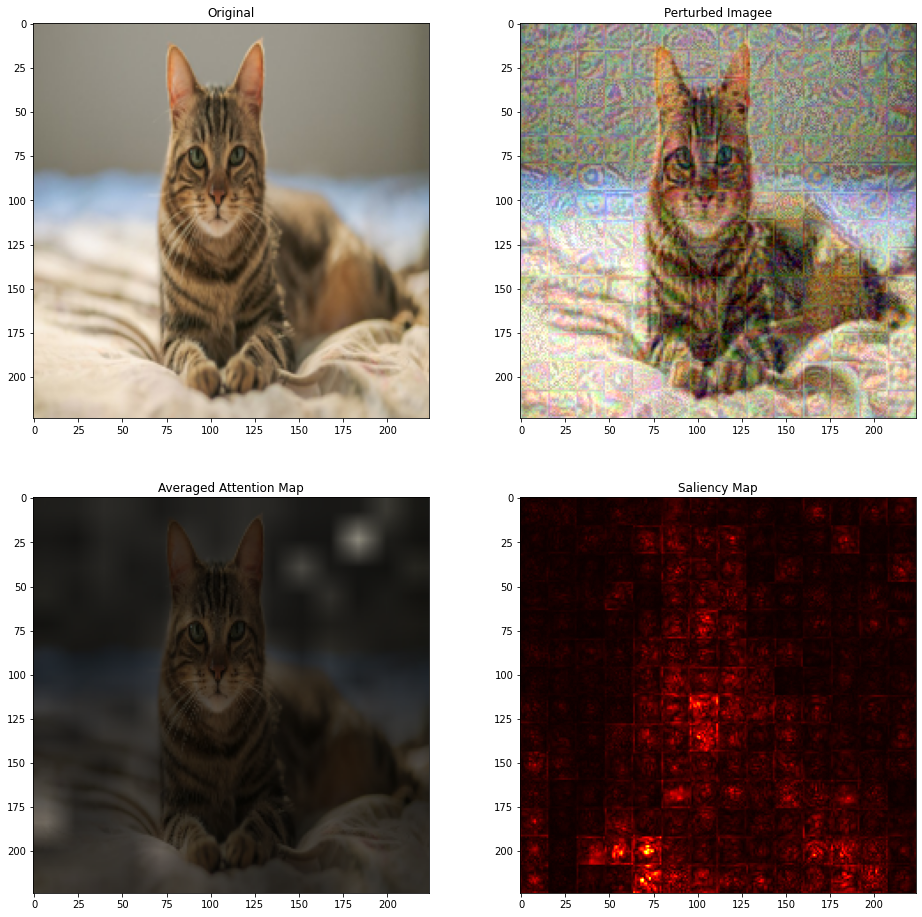

In [ ]:
plot_orig_saliency_perturbed_attnmap(x=adv_tensor, model=model, attn_map=map)

## What happens if we use a very large epsilon?

In [ ]:
# set up PGD-20 attack
eps = 255 / 255

attack = ProjectedGradientDescentPyTorch(
        estimator=classifier,
        norm="inf",
        eps=eps,
        targeted=True,
        eps_step=0.05,
        max_iter=20 
)

x.requires_grad_(False)

#  504: 'coffee mug',
target_label = torch.zeros((1, 1000))
target_label[0][504] = 1

adv_1 = attack.generate(x=x.unsqueeze(0), y=target_label)
adv_tensor = torch.from_numpy(adv_1).to('cpu')

adv_tensor.requires_grad_(True)

/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:694: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_grad = torch.tensor(x).to(self._device)
/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:695: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y_grad = torch.tensor(y).to(self._device)


tensor([[[[-0.3333, -0.5255, -0.5255,  ..., -0.4137, -0.0137,  0.0784],
          [-0.4255, -0.5255, -0.4255,  ..., -0.2137, -0.4216,  0.0784],
          [-0.4333, -0.4255, -0.4255,  ..., -0.3137, -0.4216, -0.1216],
          ...,
          [ 0.4843,  0.4765,  0.7608,  ...,  0.6235,  0.6235,  0.2922],
          [ 0.3078,  0.3078,  0.5922,  ...,  0.7235,  0.7157,  0.4000],
          [ 0.2235,  0.2235,  0.5078,  ...,  0.5078,  0.3078,  0.3922]],

         [[ 0.1353,  0.1431, -0.0569,  ..., -0.9373, -0.1373,  0.0549],
          [ 0.2431, -0.1569,  0.0431,  ..., -0.2373, -0.1451,  0.1549],
          [ 0.2353, -0.1569,  0.0431,  ..., -0.4373, -0.2451, -0.0451],
          ...,
          [ 0.7588,  0.7510,  0.5353,  ...,  0.5059,  0.4980,  0.5667],
          [ 0.5902,  0.4902,  0.6745,  ...,  0.5980,  0.5824,  0.4588],
          [ 0.5059,  0.6059,  0.3902,  ...,  0.4824,  0.4745,  0.4510]],

         [[-0.0588,  0.2490,  0.2490,  ..., -0.4549, -0.1549, -0.2627],
          [ 0.1490,  0.4490,  

In [ ]:
map = construct_attention_maps(x=adv_tensor, model=model)

Prediction Label and Attention Map!

0.99926 : coffee_mug
0.00028 : cup
0.00003 : espresso
0.00003 : coffeepot
0.00003 : whiskey_jug


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


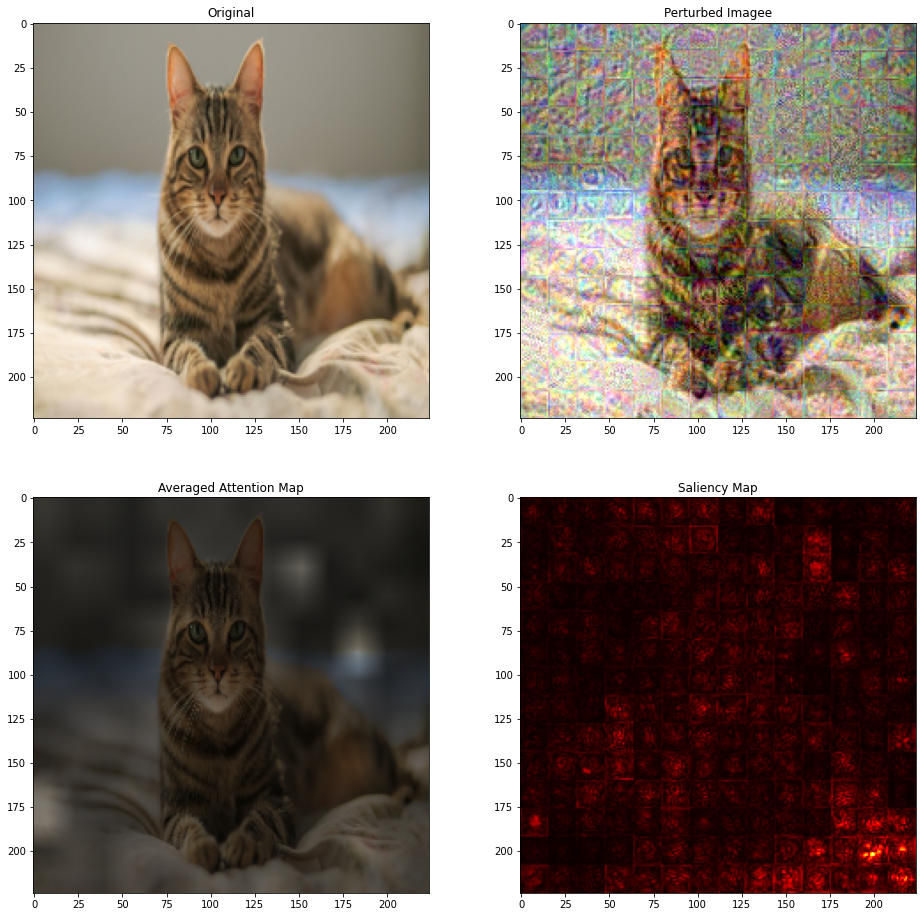

In [ ]:
plot_orig_saliency_perturbed_attnmap(x=adv_tensor, model=model, attn_map=map)

## Lets Try an L2 Attack

In [ ]:
# set up PGD-20 attack
eps = 100 / 255

attack = ProjectedGradientDescentPyTorch(
        estimator=classifier,
        norm=2,
        eps=eps,
        targeted=True,
        eps_step=0.05,
        max_iter=20 
)

x.requires_grad_(False)

#  504: 'coffee mug',
target_label = torch.zeros((1, 1000))
target_label[0][504] = 1

adv_1 = attack.generate(x=x.unsqueeze(0), y=target_label)
adv_tensor = torch.from_numpy(adv_1).to('cpu')

adv_tensor.requires_grad_(True)

/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:694: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_grad = torch.tensor(x).to(self._device)
/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:695: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y_grad = torch.tensor(y).to(self._device)


tensor([[[[ 0.0637,  0.0750,  0.0748,  ..., -0.1106, -0.1111, -0.1173],
          [ 0.0713,  0.0745,  0.0742,  ..., -0.1121, -0.1195, -0.1181],
          [ 0.0624,  0.0738,  0.0742,  ..., -0.1129, -0.1200, -0.1179],
          ...,
          [ 0.5857,  0.5764,  0.5604,  ...,  0.6245,  0.6246,  0.5926],
          [ 0.6090,  0.6080,  0.5922,  ...,  0.6248,  0.6166,  0.6011],
          [ 0.6260,  0.6247,  0.6095,  ...,  0.6092,  0.6095,  0.5934]],

         [[ 0.0322,  0.0433,  0.0432,  ..., -0.1381, -0.1380, -0.1430],
          [ 0.0401,  0.0433,  0.0434,  ..., -0.1390, -0.1459, -0.1435],
          [ 0.0318,  0.0431,  0.0436,  ..., -0.1387, -0.1457, -0.1425],
          ...,
          [ 0.4642,  0.4532,  0.4363,  ...,  0.5049,  0.4972,  0.4660],
          [ 0.4941,  0.4916,  0.4748,  ...,  0.4966,  0.4807,  0.4581],
          [ 0.5092,  0.5065,  0.4903,  ...,  0.4814,  0.4739,  0.4508]],

         [[-0.0602, -0.0512, -0.0515,  ..., -0.2566, -0.2569, -0.2635],
          [-0.0515, -0.0504, -

In [ ]:
map = construct_attention_maps(x=adv_tensor, model=model)

Prediction Label and Attention Map!

0.53235 : tabby, tabby_cat
0.18528 : Egyptian_cat
0.13794 : tiger_cat
0.12249 : quilt, comforter, comfort, puff
0.00431 : lynx, catamount


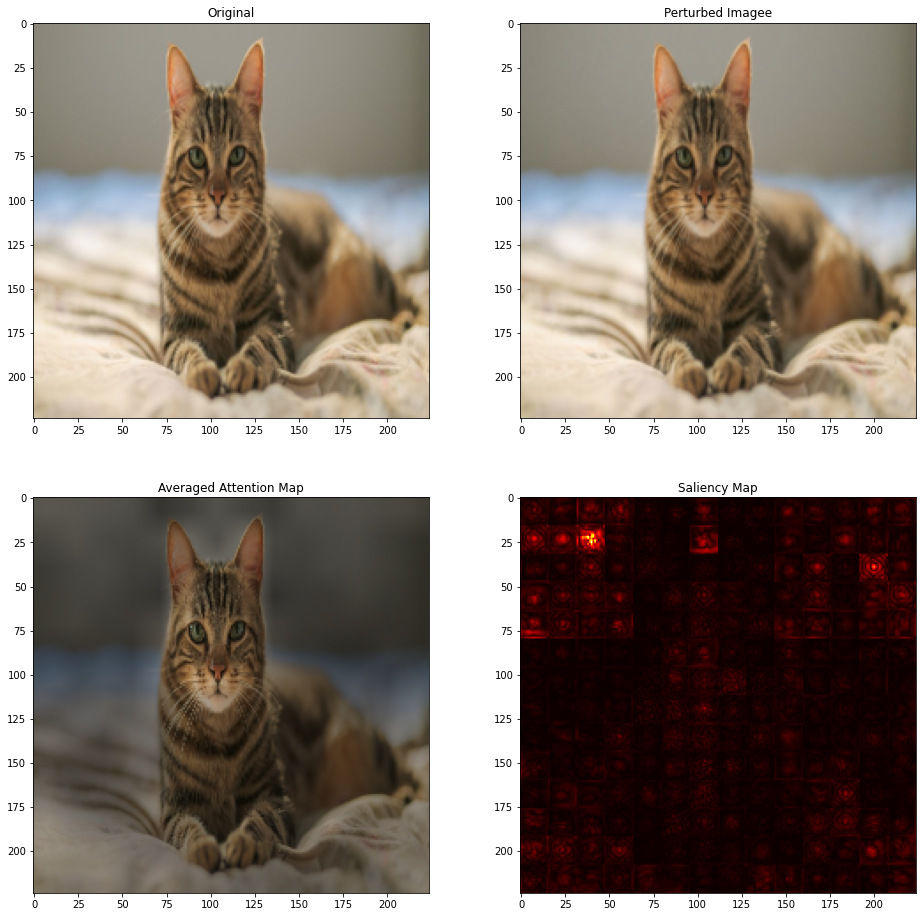

In [ ]:
plot_orig_saliency_perturbed_attnmap(x=adv_tensor, model=model, attn_map=map)

### Maybe we have to increase epsilon

In [ ]:
# set up PGD-20 attack
eps = 200 / 255

attack = ProjectedGradientDescentPyTorch(
        estimator=classifier,
        norm=2,
        eps=eps,
        targeted=True,
        eps_step=0.05,
        max_iter=20 
)

x.requires_grad_(False)

#  504: 'coffee mug',
target_label = torch.zeros((1, 1000))
target_label[0][504] = 1

adv_1 = attack.generate(x=x.unsqueeze(0), y=target_label)
adv_tensor = torch.from_numpy(adv_1).to('cpu')

adv_tensor.requires_grad_(True)

/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:694: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_grad = torch.tensor(x).to(self._device)
/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:695: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y_grad = torch.tensor(y).to(self._device)


tensor([[[[ 0.0588,  0.0732,  0.0731,  ..., -0.1087, -0.1093, -0.1147],
          [ 0.0677,  0.0739,  0.0738,  ..., -0.1114, -0.1186, -0.1164],
          [ 0.0583,  0.0730,  0.0735,  ..., -0.1127, -0.1193, -0.1163],
          ...,
          [ 0.5867,  0.5765,  0.5604,  ...,  0.6249,  0.6250,  0.5929],
          [ 0.6096,  0.6082,  0.5921,  ...,  0.6252,  0.6169,  0.6015],
          [ 0.6269,  0.6250,  0.6100,  ...,  0.6103,  0.6105,  0.5944]],

         [[ 0.0301,  0.0434,  0.0430,  ..., -0.1376, -0.1376, -0.1413],
          [ 0.0389,  0.0442,  0.0444,  ..., -0.1395, -0.1461, -0.1425],
          [ 0.0303,  0.0438,  0.0445,  ..., -0.1391, -0.1457, -0.1411],
          ...,
          [ 0.4664,  0.4544,  0.4371,  ...,  0.5042,  0.4966,  0.4658],
          [ 0.4957,  0.4924,  0.4749,  ...,  0.4956,  0.4798,  0.4578],
          [ 0.5103,  0.5067,  0.4904,  ...,  0.4814,  0.4740,  0.4513]],

         [[-0.0612, -0.0520, -0.0531,  ..., -0.2574, -0.2579, -0.2641],
          [-0.0514, -0.0507, -

In [ ]:
map = construct_attention_maps(x=adv_tensor, model=model)

Prediction Label and Attention Map!

0.44084 : tabby, tabby_cat
0.21110 : quilt, comforter, comfort, puff
0.19083 : Egyptian_cat
0.11643 : tiger_cat
0.00476 : lynx, catamount


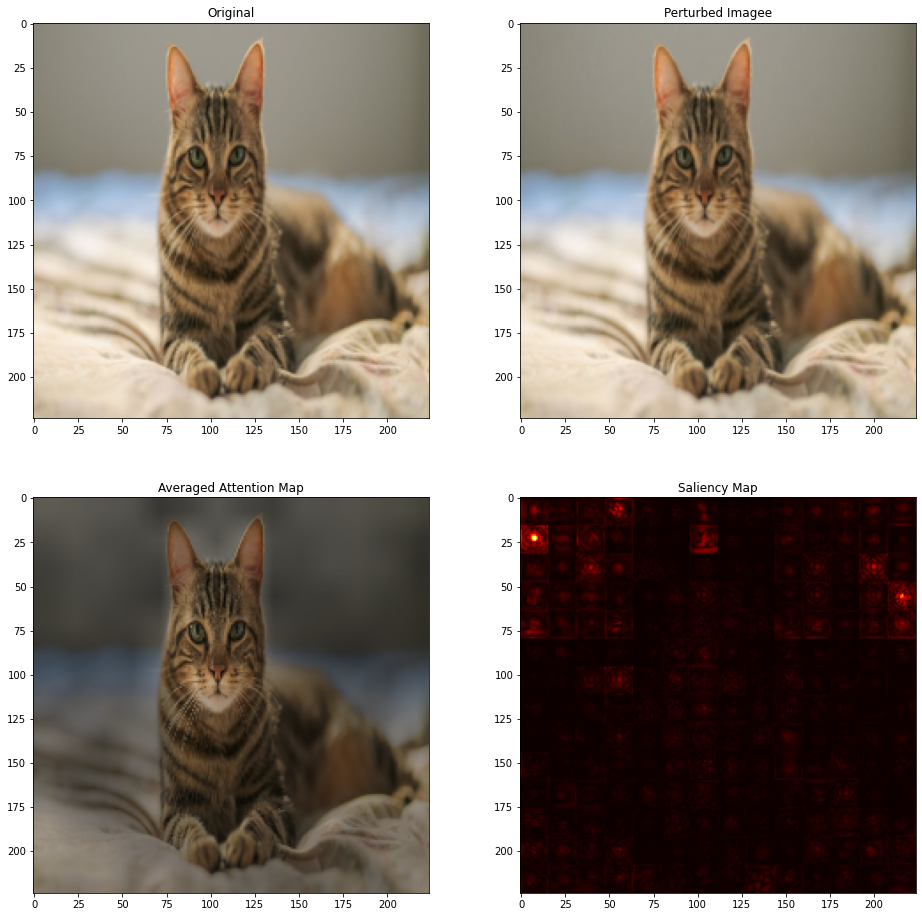

In [ ]:
plot_orig_saliency_perturbed_attnmap(x=adv_tensor, model=model, attn_map=map)

### Maybe increase number of iterations?

/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:694: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_grad = torch.tensor(x).to(self._device)
/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:695: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y_grad = torch.tensor(y).to(self._device)


Prediction Label and Attention Map!

0.26302 : tabby, tabby_cat
0.22281 : Egyptian_cat
0.10060 : tiger_cat
0.07880 : quilt, comforter, comfort, puff
0.01919 : remote_control, remote


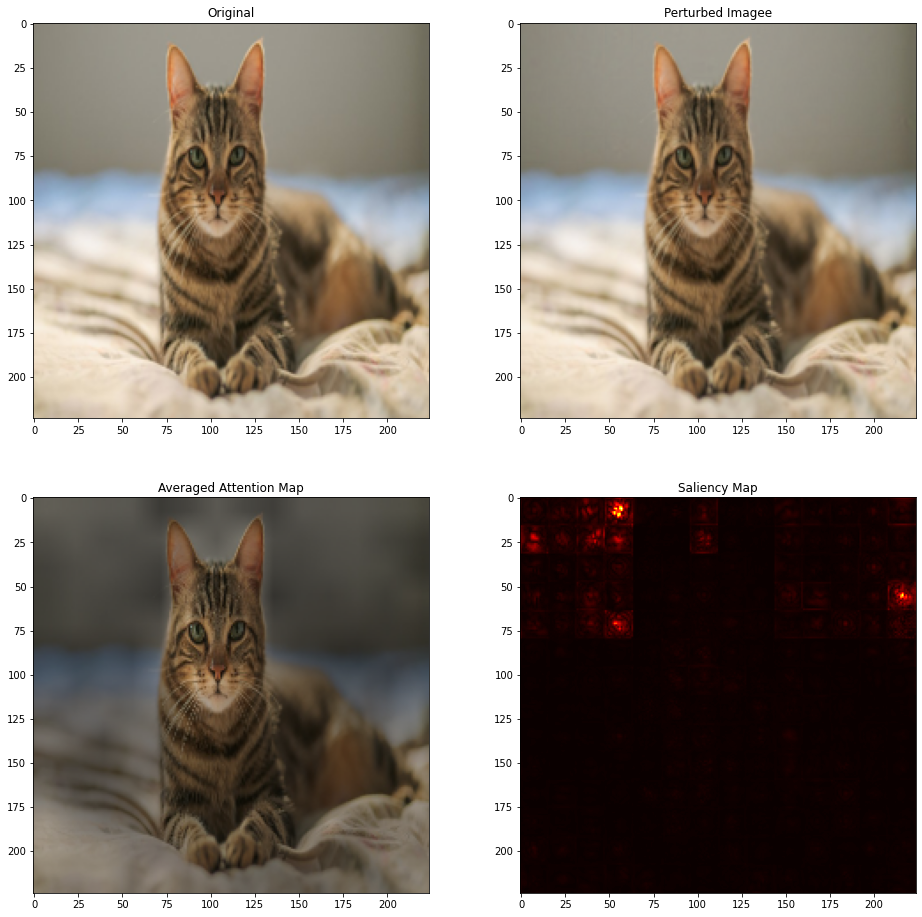

In [ ]:
# set up PGD-20 attack
eps = 200 / 255

attack = ProjectedGradientDescentPyTorch(
        estimator=classifier,
        norm=2,
        eps=eps,
        targeted=True,
        eps_step=0.05,
        max_iter=40 
)

x.requires_grad_(False)

#  504: 'coffee mug',
target_label = torch.zeros((1, 1000))
target_label[0][504] = 1

adv_1 = attack.generate(x=x.unsqueeze(0), y=target_label)
adv_tensor = torch.from_numpy(adv_1).to('cpu')

adv_tensor.requires_grad_(True)

map = construct_attention_maps(x=adv_tensor, model=model)
plot_orig_saliency_perturbed_attnmap(x=adv_tensor, model=model, attn_map=map)

### Also try an untargeted attack

/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:694: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_grad = torch.tensor(x).to(self._device)
/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:695: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y_grad = torch.tensor(y).to(self._device)


Prediction Label and Attention Map!

0.69660 : tabby, tabby_cat
0.18311 : Egyptian_cat
0.11498 : tiger_cat
0.00252 : lynx, catamount
0.00024 : quilt, comforter, comfort, puff


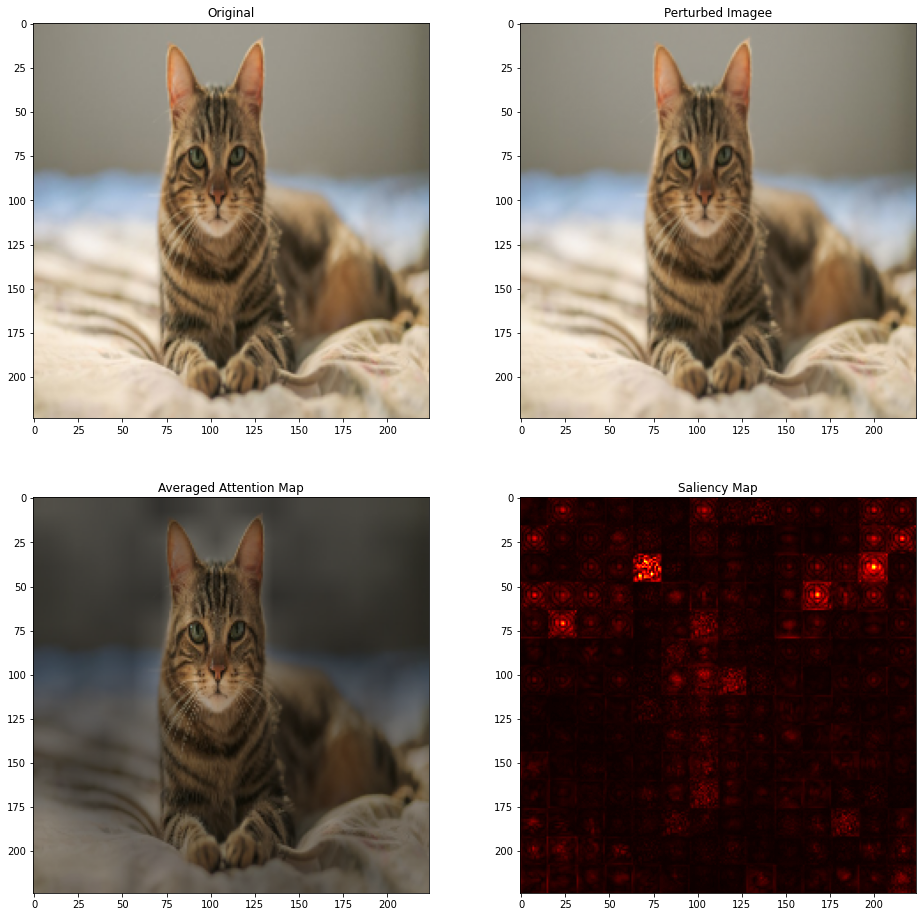

In [ ]:
# set up PGD-20 attack
eps = 8 / 255

attack = ProjectedGradientDescentPyTorch(
        estimator=classifier,
        norm=2,
        eps=eps,
        targeted=False,
        eps_step=0.05,
        max_iter=20 
)

x.requires_grad_(False)

#  504: 'coffee mug',
# target_label = torch.zeros((1, 1000))
# target_label[0][504] = 1

# adv_1 = attack.generate(x=x.unsqueeze(0), y=target_label)

adv_1 = attack.generate(x=x.unsqueeze(0))
adv_tensor = torch.from_numpy(adv_1).to('cpu')

adv_tensor.requires_grad_(True)

map = construct_attention_maps(x=adv_tensor, model=model)
plot_orig_saliency_perturbed_attnmap(x=adv_tensor, model=model, attn_map=map)

### Also try an untargeted attack with a little bigger epsilon?

/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:694: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_grad = torch.tensor(x).to(self._device)
/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:695: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y_grad = torch.tensor(y).to(self._device)


Prediction Label and Attention Map!

0.52286 : tabby, tabby_cat
0.33231 : Egyptian_cat
0.13081 : tiger_cat
0.00677 : quilt, comforter, comfort, puff
0.00307 : lynx, catamount


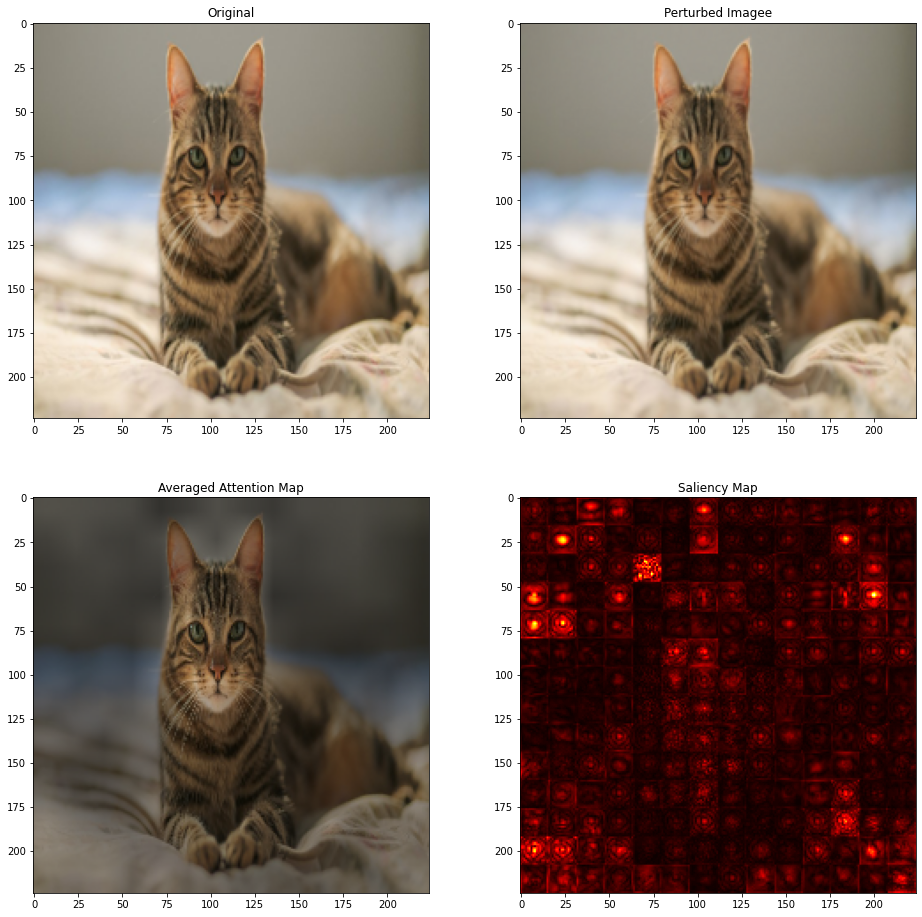

In [ ]:
# set up PGD-20 attack
eps = 50 / 255

attack = ProjectedGradientDescentPyTorch(
        estimator=classifier,
        norm=2,
        eps=eps,
        targeted=False,
        eps_step= 12.5 / 255,
        max_iter=20 
)

x.requires_grad_(False)

#  504: 'coffee mug',
# target_label = torch.zeros((1, 1000))
# target_label[0][504] = 1

# adv_1 = attack.generate(x=x.unsqueeze(0), y=target_label)

adv_1 = attack.generate(x=x.unsqueeze(0))
adv_tensor = torch.from_numpy(adv_1).to('cpu')

adv_tensor.requires_grad_(True)

map = construct_attention_maps(x=adv_tensor, model=model)
plot_orig_saliency_perturbed_attnmap(x=adv_tensor, model=model, attn_map=map)

/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:694: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_grad = torch.tensor(x).to(self._device)
/usr/local/lib/python3.7/dist-packages/art/estimators/classification/pytorch.py:695: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y_grad = torch.tensor(y).to(self._device)


Prediction Label and Attention Map!

0.63455 : Egyptian_cat
0.27035 : tabby, tabby_cat
0.08438 : tiger_cat
0.00419 : quilt, comforter, comfort, puff
0.00333 : lynx, catamount


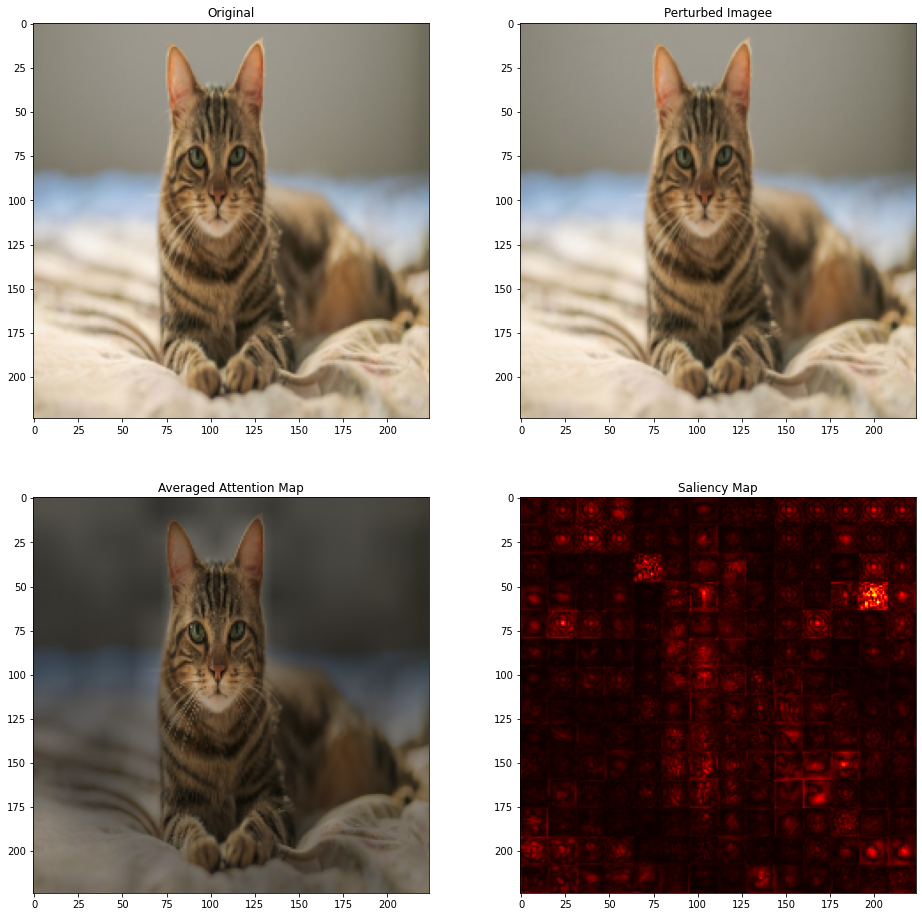

In [ ]:
# set up PGD-20 attack
eps = 100 / 255

attack = ProjectedGradientDescentPyTorch(
        estimator=classifier,
        norm=2,
        eps=eps,
        targeted=False,
        eps_step= 12.5 / 255,
        max_iter=20 
)

x.requires_grad_(False)

#  504: 'coffee mug',
# target_label = torch.zeros((1, 1000))
# target_label[0][504] = 1

# adv_1 = attack.generate(x=x.unsqueeze(0), y=target_label)

adv_1 = attack.generate(x=x.unsqueeze(0))
adv_tensor = torch.from_numpy(adv_1).to('cpu')

adv_tensor.requires_grad_(True)

map = construct_attention_maps(x=adv_tensor, model=model)
plot_orig_saliency_perturbed_attnmap(x=adv_tensor, model=model, attn_map=map)